# Smash OCR #

Smash OCR, thank you [youtube-chord-ocr](https://github.com/henridwyer/youtube-chord-ocr)

In [148]:
from IPython.display import YouTubeVideo

# Dr. PP (Falco) vs Rocky (C.Falcon) Pools R2
YouTubeVideo('xPJCiML28Ds')

# Contents #
- [Downloading Videos](#Downloading-Videos)
- [Reading Damage](#Reading-Damage)
- [Tying Everything Together](#Tying-Everything-Together)
- [Profiling](#Profiling)

In [149]:
import smash_ocr, cv2

In [150]:
reload(smash_ocr)

<module 'smash_ocr' from 'smash_ocr.py'>

## Downloading Videos ##

First we will download a video with user input of start/end times of the game, and the dimensions of the match video.

In order to download the videos, we will use the python package [youtube-dl](https://github.com/rg3/youtube-dl). 
And probably [ffmpeg](https://www.ffmpeg.org/) to optimise download time and crop sections.


In [151]:
VIDEO_ID = 'xPJCiML28Ds'
START_TIME = 2
DURATION = 10
CROP = (480,360,80,0)

In [140]:
# Use youtube-dl and ffmpeg to obtain the direct video URL
smash_ocr.download_video(VIDEO_ID, START_TIME, DURATION)

In [141]:
reload(smash_ocr)
# Crop downloaded video to only contain melee
smash_ocr.crop_video(VIDEO_ID, CROP)

#### Preprocessing Match Video ##



# Reading Damage

In [152]:
video = "output/p1.mp4"
print "Reading " + video
vidcap = cv2.VideoCapture(video)
video_nb_frames = vidcap.get(cv2.cv.CV_CAP_PROP_FRAME_COUNT)
print video_nb_frames, "frames"
vidcap.isOpened()
video_fps = vidcap.get(cv2.cv.CV_CAP_PROP_FPS)
print video_fps, "fps"

Reading output/p1.mp4
1089.97058824 frames
29.4117647059 fps


### Read the Damage in a Frame ###

In [153]:
reload(smash_ocr)
import matplotlib.cm as cm
%matplotlib inline
vidcap = cv2.VideoCapture(video)
image = None

0
[]


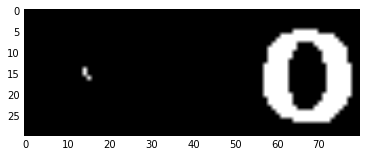

In [154]:
smash_ocr.skip_frames(vidcap, 40)
success, img = vidcap.read()
proc = smash_ocr.img_pre_process(img)
smash_ocr.show_img(proc)
damage, differences = smash_ocr.get_active_damage(img)
print damage
print differences

### Read the active damag of each frame ###

In [168]:
reload(smash_ocr)
import matplotlib.cm as cm
%matplotlib inline
vidcap = cv2.VideoCapture(video)

In [169]:
frame_damage = smash_ocr.vidcap_to_frame_damage(vidcap, video_fps, nb_frames = -1)
frame_damage

[(0,
  [167,
   178,
   235,
   1,
   1,
   5,
   4,
   4,
   4,
   4,
   4,
   5,
   6,
   6,
   7,
   7,
   7,
   7,
   7,
   6,
   6,
   6,
   6,
   6,
   7,
   8,
   10,
   13,
   11,
   11,
   9,
   7,
   9,
   10,
   10,
   13,
   12,
   12,
   12,
   10,
   12,
   10,
   10,
   10,
   10,
   10,
   11,
   11,
   11,
   11,
   11,
   11,
   11,
   15,
   15,
   15,
   15,
   13,
   12,
   12,
   12,
   9,
   9,
   9,
   9,
   9,
   9,
   9,
   10,
   10,
   10,
   10,
   11,
   13,
   10,
   11,
   11,
   11,
   11,
   12,
   12,
   14,
   19,
   12,
   12,
   13,
   13,
   365,
   68,
   378,
   313,
   209,
   1,
   2,
   486,
   600,
   357,
   381,
   563,
   490,
   0,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   3,
   3,
   3,
   3,
   3,
   3,
   3,
   4,
   3,
   3,
   4,
   9,
   5,
   10,
   24,
   14,
   15,
   106,
   91,
   6,
   12,
   21,
   19,
   17,
   11,
   25,
   0,
   8,
   17,
   17,
   17,
   17,
   16,
   21,
   20,
   21,
  

### Convert to intervals ###
Damage will only increase to 999 or go back to 0. 
Chords generally come in intervals: several consecutive frames have the same chord. We can write this as a list:

(start frame, end frame), chord name

In [ ]:
damage_intervals = video_ocr.frame_damage_to_damage_intervals(frame_damage)
print len(damage_intervals.items())
damage_intervals.items()

### Clean intervals ###

Sometimes some frames get misread, so first we'll remove any interval that is too short. Then we'll merge intervals that are separated by only a few frames without any chord.

In [ ]:
video_ocr.filter_chord_intervals(chord_intervals, video_fps)
print len(chord_intervals.items())

In [ ]:
merged = video_ocr.merge_chord_intervals(chord_intervals, video_fps)
print len(merged.items())

In [ ]:
merged

In [165]:
def onlyDigits(number):
    ''.join(filter(lambda x: x.isdigit(), number))
print onlyDigits('asdf3')

None


## Creating Labeled Audio Files ##

First, we will create a wav file that contains the audio from the video using ffmpeg. Then we will split the audio file according to the intervals creating above.

In [ ]:
wav_file = video_ocr.extract_audio_from_video(video)
wav_file

In [ ]:
import os
output_dir = video_ocr.get_file_name(video) + '/'
print output_dir

# if the directory doesn't exist, create it. Otherwise, delete the contents.
try:
    os.mkdir(output_dir)
except OSError:
    files = ! ls {json.dumps(output_dir)}
    for f in files:
        os.remove(output_dir + f)
    pass #directory already exists, clear contents

In [ ]:
video_ocr.chord_intervals_to_audio_snips(chord_intervals, wav_file, output_dir, video_nb_frames)

In [ ]:
video_ocr.cleanup()

## Tying Everything Together ##

This function creates a folder output, with 1 subfolder for each video, containing the labeled audio files.

In [ ]:
video_ocr.video_list_to_audio_snips(videos, True)

# Profiling #

Run this code to profile the get_active_chord function.

In [ ]:
video = videos[0]
print "Reading " + video
vidcap = cv2.VideoCapture(video)
print(vidcap.get(cv2.cv.CV_CAP_PROP_FRAME_COUNT))
vidcap.isOpened()

In [ ]:
def read_frames(nb_frames):
    frame_chords = []
    previous_frame = None
    for i in range(nb_frames):
        success,image = vidcap.read()
        frame_chords.append(get_active_chord(image))
    return frame_chords

In [ ]:
# run cprofilev cprofile_output.txt
pr = cProfile.Profile()
pr.runctx('read_frames(500)', None, locals())
pr.dump_stats("cprofile_output.txt")